In [19]:
import os

global BASE_DIR, WORK_DIR

if os.path.exists('/kaggle/input/astroimg'):
    BASE_DIR = "/kaggle/input/astroimg"
    WORK_DIR = "/kaggle/working"
elif os.path.exists('/content'):
    BASE_DIR = "/content/drive/MyDrive/astro-autoencoder"
    WORK_DIR = "/content/drive/MyDrive/astro-autoencoder"
else:
    BASE_DIR = "./astro-autoencoder"
    WORK_DIR = "./output"

required_dirs = [
    f"{BASE_DIR}/data/train_data",
    f"{BASE_DIR}/data/test_data"
]

for dir_path in required_dirs:
    if os.path.exists(dir_path):
        fits_files = [f for f in os.listdir(dir_path) if f.endswith('.fits')]
        print(f"{dir_path}: {len(fits_files)} files")

/kaggle/input/astroimg/data/train_data: 82 files
/kaggle/input/astroimg/data/test_data: 18 files


# INSTALL REQUIRED LIBRARIES

In [20]:
pip install numpy matplotlib torch torchvision astropy scikit-image tqdm pytorch-msssim

Note: you may need to restart the kernel to use updated packages.


Loading: 100%|██████████| 82/82 [00:03<00:00, 21.23it/s]


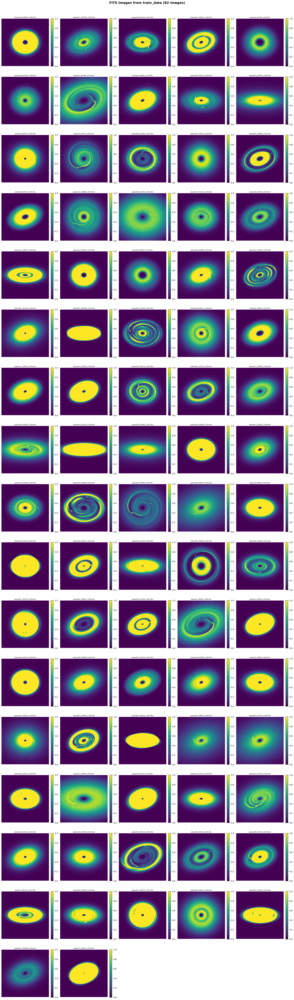

Loading: 100%|██████████| 18/18 [00:01<00:00, 15.67it/s]


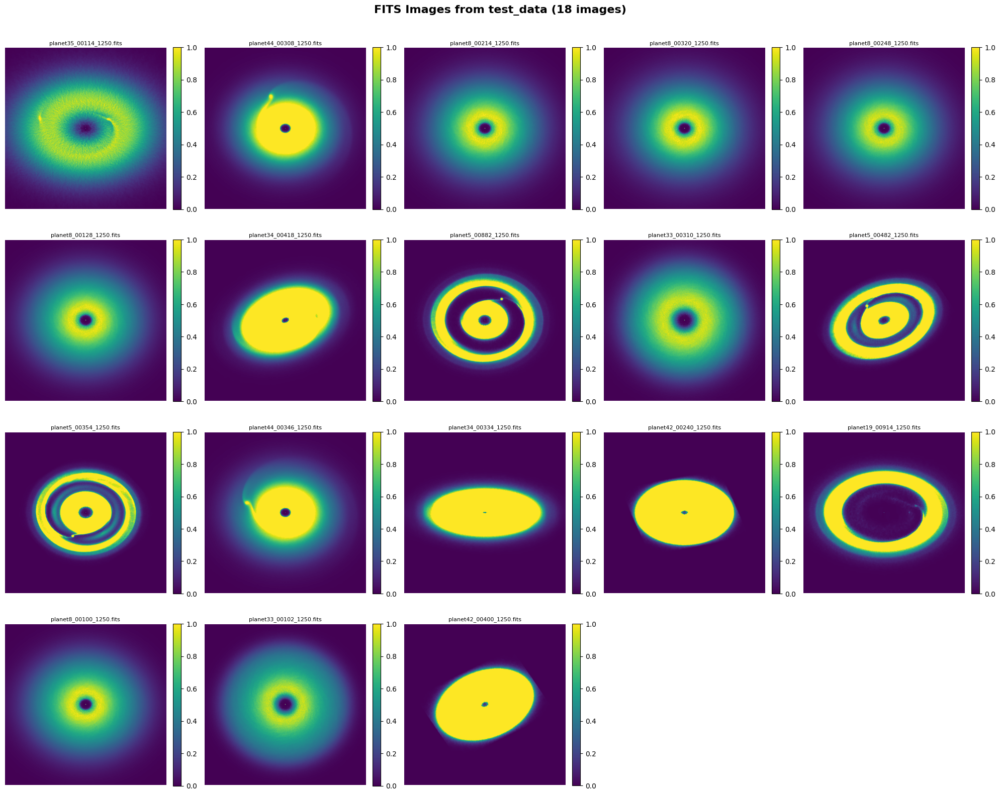

In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.visualization import ZScaleInterval
from glob import glob
from tqdm import tqdm

def visualize_all_fits_images(data_dir, max_images=None, cols=5, figsize_per_image=(4, 4), 
                               cmap='viridis', normalize='zscale', save_path=None):
    fits_files = glob(os.path.join(data_dir, '*.fits'))
    
    if len(fits_files) == 0:
        print(f"No FITS files found in {data_dir}")
        return
    
    if max_images is not None:
        fits_files = fits_files[:max_images]
    
    n_images = len(fits_files)
    rows = (n_images + cols - 1) // cols
    fig = plt.figure(figsize=(cols * figsize_per_image[0], rows * figsize_per_image[1]))
    zscale = ZScaleInterval()
    
    for idx, file_path in enumerate(tqdm(fits_files, desc="Loading")):
        try:
            with fits.open(file_path) as hdul:
                image_data = hdul[0].data
                while image_data.ndim > 2:
                    image_data = image_data[0]
                image_data = np.nan_to_num(image_data)
                
                if normalize == 'zscale':
                    image_data = zscale(image_data)
                    min_val = np.min(image_data)
                    max_val = np.max(image_data)
                    if max_val > min_val:
                        image_data = (image_data - min_val) / (max_val - min_val)
                elif normalize == 'minmax':
                    min_val = np.min(image_data)
                    max_val = np.max(image_data)
                    if max_val > min_val:
                        image_data = (image_data - min_val) / (max_val - min_val)
                
                ax = plt.subplot(rows, cols, idx + 1)
                im = ax.imshow(image_data, cmap=cmap, origin='lower')
                filename = os.path.basename(file_path)
                ax.set_title(filename, fontsize=8, pad=5)
                ax.axis('off')
                plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                
        except Exception as e:
            ax = plt.subplot(rows, cols, idx + 1)
            ax.text(0.5, 0.5, f"Error\n{os.path.basename(file_path)}", 
                   ha='center', va='center', fontsize=8)
            ax.axis('off')
    
    plt.suptitle(f'FITS Images from {os.path.basename(data_dir)} ({n_images} images)', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()


visualize_all_fits_images(
    data_dir='/kaggle/input/astroimg/data/train_data',
    cols=5,
    cmap='viridis',
    normalize='zscale',
    save_path='output/all_training_images.png'
)

visualize_all_fits_images(
    data_dir='/kaggle/input/astroimg/data/test_data',
    max_images=20,
    cols=5,
    cmap='viridis',
    normalize='zscale',
    save_path='output/all_test_images.png'
)

In [22]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from astropy.io import fits
from skimage.transform import resize
from tqdm import tqdm
from pytorch_msssim import ms_ssim, ssim

class loadData(Dataset):
    def __init__(self, data_folder, transform=None, global_stats=None):
        self.data_folder = data_folder
        self.transform = transform
        self.image_files = [f for f in os.listdir(data_folder) if f.endswith('.fits')]

        if global_stats is None:
            self.global_stats = self._compute_global_stats()
        else:
            self.global_stats = global_stats

        print(f"Dataset: {len(self.image_files)} images")

    def _compute_global_stats(self):
        print(f"Computing statistics on {len(self.image_files)} images")
        all_values = []

        for img_file in tqdm(self.image_files, desc="Computing stats"):
            img_path = os.path.join(self.data_folder, img_file)
            try:
                with fits.open(img_path) as hdul:
                    img_data = hdul[0].data

                    if len(img_data.shape) == 5:
                        img_data = img_data[0, 0, 0]
                    elif len(img_data.shape) == 4:
                        img_data = img_data[0, 0]
                    elif len(img_data.shape) == 3:
                        img_data = img_data[0]

                    img_data = img_data.astype(np.float32)
                    img_resized = resize(img_data, (187, 187), order=1, preserve_range=True)

                    img_resized = img_resized[np.isfinite(img_resized)]
                    if len(img_resized) > 0:
                        all_values.extend(img_resized.flatten())
            except Exception as e:
                print(f"Warning: {img_file}: {e}")
                continue

        if len(all_values) == 0:
            raise ValueError("No valid data found")

        all_values = np.array(all_values)

        min_val = np.percentile(all_values, 1)
        max_val = np.percentile(all_values, 99)
        mean_val = np.mean(all_values)
        std_val = np.std(all_values)

        return {
            'min': min_val,
            'max': max_val,
            'mean': mean_val,
            'std': std_val,
            'data_range': max_val - min_val
        }

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.data_folder, self.image_files[idx])
        with fits.open(img_path) as hdul:
            img_data = hdul[0].data

            if len(img_data.shape) == 5:
                img_data = img_data[0, 0, 0]
            elif len(img_data.shape) == 4:
                img_data = img_data[0, 0]
            elif len(img_data.shape) == 3:
                img_data = img_data[0]

        img_data = img_data.astype(np.float32)
        img_resized = resize(img_data, (187, 187), order=1, preserve_range=True)

        img_clamped = np.clip(img_resized, self.global_stats['min'], self.global_stats['max'])
        img_normalized = (img_clamped - self.global_stats['min']) / (self.global_stats['max'] - self.global_stats['min'])

        img_tensor = torch.tensor(img_normalized).float().unsqueeze(0)

        if self.transform:
            img_tensor = self.transform(img_tensor)

        return img_tensor

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout_rate=0.1):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Dropout2d(dropout_rate),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )
        self.pool = nn.MaxPool2d(2)

    def forward(self, x):
        pre_pool = self.conv(x)
        pooled = self.pool(pre_pool)
        return pooled, pre_pool

class UNetEncoder(nn.Module):
    def __init__(self, latent_dim=64, dropout_rate=0.1):
        super(UNetEncoder, self).__init__()
        self.conv1 = ConvBlock(1, 16, dropout_rate)
        self.conv2 = ConvBlock(16, 32, dropout_rate)
        self.conv3 = ConvBlock(32, 64, dropout_rate)
        self.conv4 = ConvBlock(64, 128, dropout_rate)

        self.pool = nn.AdaptiveAvgPool2d((7, 7))

        self.flatten = nn.Flatten()
        self.fc = nn.Sequential(
            nn.Linear(128 * 7 * 7, 512),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(512, latent_dim)
        )

    def forward(self, x):
        x1, skip1 = self.conv1(x)
        x2, skip2 = self.conv2(x1)
        x3, skip3 = self.conv3(x2)
        x4, skip4 = self.conv4(x3)

        x5 = self.pool(x4)
        x_flat = self.flatten(x5)
        latent = self.fc(x_flat)

        return latent, [skip1, skip2, skip3, skip4]

class UpBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels, dropout_rate=0.1):
        super(UpBlock, self).__init__()
        self.upconv = nn.Sequential(
            nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(in_channels // 2),
            nn.ReLU()
        )
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels // 2 + skip_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Dropout2d(dropout_rate),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x, skip):
        x = self.upconv(x)

        if x.size() != skip.size():
            x = nn.functional.interpolate(x, size=skip.size()[2:])

        x = torch.cat([x, skip], dim=1)
        x = self.conv(x)
        return x

class UNetDecoder(nn.Module):
    def __init__(self, latent_dim=64, dropout_rate=0.1):
        super(UNetDecoder, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 512),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(512, 128 * 7 * 7)
        )
        self.unflatten = nn.Unflatten(1, (128, 7, 7))

        self.upconv1 = nn.Sequential(
            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )

        self.up2 = UpBlock(128, 128, 64, dropout_rate)
        self.up3 = UpBlock(64, 64, 32, dropout_rate)
        self.up4 = UpBlock(32, 32, 16, dropout_rate)

        self.up5 = nn.Sequential(
            nn.ConvTranspose2d(16, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU()
        )

        self.merge_first_skip = nn.Sequential(
            nn.Conv2d(16 + 16, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU()
        )

        self.adaptive_pool = nn.AdaptiveAvgPool2d((187, 187))

        self.final_conv = nn.Sequential(
            nn.Conv2d(16, 1, kernel_size=3, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x, skip_features):
        skip1, skip2, skip3, skip4 = skip_features

        x = self.fc(x)
        x = self.unflatten(x)
        x = self.upconv1(x)
        x = self.up2(x, skip4)
        x = self.up3(x, skip3)
        x = self.up4(x, skip2)
        x = self.up5(x)

        x = nn.functional.interpolate(x, size=(187, 187))
        x = torch.cat([x, skip1], dim=1)
        x = self.merge_first_skip(x)
        x = self.adaptive_pool(x)
        x = self.final_conv(x)
        return x

class UNet(nn.Module):
    def __init__(self, latent_dim=64, dropout_rate=0.1):
        super(UNet, self).__init__()
        self.encoder = UNetEncoder(latent_dim, dropout_rate)
        self.decoder = UNetDecoder(latent_dim, dropout_rate)

    def forward(self, x):
        latent, skip_features = self.encoder(x)
        reconstructed = self.decoder(latent, skip_features)
        return reconstructed, latent

    def encode(self, x):
        latent, _ = self.encoder(x)
        return latent

    def decode(self, x):
        return self.decoder(x, [torch.zeros((x.size(0), 16, 187, 187), device=x.device),
                              torch.zeros((x.size(0), 32, 93, 93), device=x.device),
                              torch.zeros((x.size(0), 64, 46, 46), device=x.device),
                              torch.zeros((x.size(0), 128, 23, 23), device=x.device)])

def train_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0

    for data in tqdm(dataloader, desc="Training"):
        inputs = data.to(device)
        optimizer.zero_grad()
        outputs, _ = model(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)

    epoch_loss = running_loss / len(dataloader.dataset)
    return epoch_loss

def validate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0

    with torch.no_grad():
        for data in tqdm(dataloader, desc="Validation"):
            inputs = data.to(device)
            outputs, _ = model(inputs)
            loss = criterion(outputs, inputs)
            running_loss += loss.item() * inputs.size(0)

    epoch_loss = running_loss / len(dataloader.dataset)
    return epoch_loss

def evaluate_model(model, dataloader, device, data_range=1.0):
    model.eval()
    mse_values = []
    ssim_values = []
    ms_ssim_values = []

    with torch.no_grad():
        for data in tqdm(dataloader, desc="Evaluating"):
            inputs = data.to(device)
            outputs, _ = model(inputs)

            mse = F.mse_loss(outputs, inputs).item()
            mse_values.append(mse)

            ssim_val = ssim(inputs, outputs, data_range=data_range).item()
            ssim_values.append(ssim_val)

            ms_ssim_val = ms_ssim(inputs, outputs, data_range=data_range).item()
            ms_ssim_values.append(ms_ssim_val)

    avg_mse = np.mean(mse_values)
    avg_ssim = np.mean(ssim_values)
    avg_ms_ssim = np.mean(ms_ssim_values)

    return {
        'MSE': avg_mse,
        'SSIM': avg_ssim,
        'MS-SSIM': avg_ms_ssim
    }

def visualize_reconstructions(model, dataloader, num_images=5, device=None):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    images = []
    reconstructions = []

    with torch.no_grad():
        for data in dataloader:
            inputs = data.to(device)
            outputs, _ = model(inputs)

            inputs_np = inputs.cpu().numpy()
            outputs_np = outputs.cpu().numpy()

            for i in range(inputs.shape[0]):
                images.append(inputs_np[i, 0])
                reconstructions.append(outputs_np[i, 0])

                if len(images) >= num_images:
                    break

            if len(images) >= num_images:
                break

    plt.figure(figsize=(12, 6))
    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(images[i], cmap='inferno')
        plt.title(f'Original {i+1}')
        plt.axis('off')

        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(reconstructions[i], cmap='inferno')
        plt.title(f'Reconstructed {i+1}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

def visualize_per_image_metrics(model, dataloader, num_images=20, device=None, data_range=1.0):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    images = []
    reconstructions = []
    mse_values = []
    ssim_values = []
    ms_ssim_values = []

    with torch.no_grad():
        for data in dataloader:
            inputs = data.to(device)
            outputs, _ = model(inputs)

            inputs_np = inputs.cpu().numpy()
            outputs_np = outputs.cpu().numpy()

            for i in range(inputs.shape[0]):
                images.append(inputs_np[i, 0])
                reconstructions.append(outputs_np[i, 0])

                single_input = inputs[i:i+1]
                single_output = outputs[i:i+1]

                mse = F.mse_loss(single_output, single_input).item()
                mse_values.append(mse)

                ssim_val = ssim(single_input, single_output, data_range=data_range).item()
                ssim_values.append(ssim_val)

                ms_ssim_val = ms_ssim(single_input, single_output, data_range=data_range).item()
                ms_ssim_values.append(ms_ssim_val)

                if len(images) >= num_images:
                    break

            if len(images) >= num_images:
                break

    fig, axes = plt.subplots(3, num_images, figsize=(15, 9))

    for i in range(num_images):
        axes[0, i].imshow(images[i], cmap='inferno')
        axes[0, i].set_title(f'Original {i+1}')
        axes[0, i].axis('off')

        axes[1, i].imshow(reconstructions[i], cmap='inferno')
        axes[1, i].set_title(f'Reconstructed {i+1}')
        axes[1, i].axis('off')

        axes[2, i].axis('off')
        axes[2, i].text(0.5, 0.7, f"MSE: {mse_values[i]:.6f}", ha='center')
        axes[2, i].text(0.5, 0.5, f"SSIM: {ssim_values[i]:.6f}", ha='center')
        axes[2, i].text(0.5, 0.3, f"MS-SSIM: {ms_ssim_values[i]:.6f}", ha='center')

    plt.tight_layout()
    plt.suptitle('Per-Image Reconstruction Quality', fontsize=16)
    plt.subplots_adjust(top=0.9)
    plt.show()

    return {
        'MSE': mse_values,
        'SSIM': ssim_values,
        'MS-SSIM': ms_ssim_values
    }

def extract_latent_representations(model, dataloader, device=None):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    latent_vectors = []
    image_names = []

    with torch.no_grad():
        for i, data in enumerate(tqdm(dataloader, desc="Extracting latent vectors")):
            inputs = data.to(device)
            latent, _ = model.encoder(inputs)
            latent_np = latent.cpu().numpy()
            latent_vectors.extend(latent_np)

            for j in range(inputs.shape[0]):
                image_names.append(f"Image_{i*dataloader.batch_size + j}")

    latent_vectors = np.array(latent_vectors)
    return latent_vectors, image_names

def visualize_latent_space(latent_vectors, image_names=None):
    n_samples = latent_vectors.shape[0]

    if latent_vectors.shape[1] == 2:
        plt.figure(figsize=(10, 8))
        plt.scatter(latent_vectors[:, 0], latent_vectors[:, 1])

        if image_names and len(image_names) <= 30:
            for i, txt in enumerate(image_names):
                plt.annotate(txt, (latent_vectors[i, 0], latent_vectors[i, 1]))

        plt.title('Latent Space Visualization (2D)')
        plt.xlabel('Latent Dimension 1')
        plt.ylabel('Latent Dimension 2')
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        from sklearn.decomposition import PCA

        pca = PCA(n_components=2)
        latent_2d_pca = pca.fit_transform(latent_vectors)

        plt.figure(figsize=(12, 10))

        plt.subplot(1, 2 if n_samples >= 5 else 1, 1)
        plt.scatter(latent_2d_pca[:, 0], latent_2d_pca[:, 1])
        plt.title('PCA Visualization')
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.grid(True)

        if n_samples >= 5:
            from sklearn.manifold import TSNE
            perplexity = min(30, n_samples // 2)

            try:
                tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
                latent_2d_tsne = tsne.fit_transform(latent_vectors)

                plt.subplot(1, 2, 2)
                plt.scatter(latent_2d_tsne[:, 0], latent_2d_tsne[:, 1])
                plt.title(f't-SNE Visualization (perplexity={perplexity})')
                plt.xlabel('t-SNE Component 1')
                plt.ylabel('t-SNE Component 2')
                plt.grid(True)
            except Exception as e:
                print(f"t-SNE failed: {e}")

        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(8, 4))
        full_pca = PCA()
        full_pca.fit(latent_vectors)
        plt.bar(range(1, len(full_pca.explained_variance_ratio_) + 1),
                full_pca.explained_variance_ratio_,
                alpha=0.7)
        plt.step(range(1, len(full_pca.explained_variance_ratio_) + 1),
                np.cumsum(full_pca.explained_variance_ratio_),
                where='mid', color='red')
        plt.ylabel('Explained variance ratio')
        plt.xlabel('Principal components')
        plt.title('PCA Explained Variance')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return latent_2d_pca if latent_vectors.shape[1] > 2 else latent_vectors

def export_latent_vectors(latent_vectors, image_names, filepath):
    os.makedirs(os.path.dirname(filepath), exist_ok=True)

    np.savez(f"{filepath}.npz",
             latent_vectors=latent_vectors,
             image_names=np.array(image_names))

    import pandas as pd
    df = pd.DataFrame(latent_vectors)
    df.columns = [f"dim_{i}" for i in range(latent_vectors.shape[1])]
    df['image_name'] = image_names
    df.to_csv(f"{filepath}.csv", index=False)

    print(f"Latent vectors exported to {filepath}")
    return df

def decode_from_latent(model, latent_vector, device=None):
    if device is None:
        device = next(model.parameters()).device

    latent_tensor = torch.tensor(latent_vector, dtype=torch.float32).unsqueeze(0).to(device)

    with torch.no_grad():
        decoded_img = model.decode(latent_tensor)

    decoded_img_np = decoded_img.cpu().squeeze(0).squeeze(0).numpy()
    return decoded_img_np

def visualize_latent_features(model, latent_vectors, image_names, device, export_dir=None, prefix="val"):
    num_examples = min(5, len(latent_vectors))
    example_indices = np.random.choice(len(latent_vectors), num_examples, replace=False)

    latent_min = np.min(latent_vectors)
    latent_max = np.max(latent_vectors)
    latent_mean = np.mean(latent_vectors)
    print(f"Latent range: [{latent_min:.6f}, {latent_max:.6f}], mean: {latent_mean:.6f}")

    fig, axes = plt.subplots(3, num_examples, figsize=(18, 9))

    for i, idx in enumerate(example_indices):
        latent_vector = latent_vectors[idx]
        print(f"Vector {idx}: [{latent_vector.min():.6f}, {latent_vector.max():.6f}]")

        decoded_img = decode_from_latent(model, latent_vector, device)

        img_min = decoded_img.min()
        img_max = decoded_img.max()
        img_mean = decoded_img.mean()
        print(f"Image {idx}: [{img_min:.6f}, {img_max:.6f}], mean: {img_mean:.6f}")

        im1 = axes[0, i].imshow(decoded_img, cmap='plasma')
        axes[0, i].set_title("Auto-scaled")
        axes[0, i].axis('off')
        fig.colorbar(im1, ax=axes[0, i], fraction=0.046, pad=0.04)

        if decoded_img.std() > 0:
            normalized_img = (decoded_img - decoded_img.mean()) / decoded_img.std()
            im2 = axes[1, i].imshow(normalized_img, cmap='seismic', vmin=-2, vmax=2)
            axes[1, i].set_title("Z-score")
        else:
            im2 = axes[1, i].imshow(decoded_img, cmap='seismic')
            axes[1, i].set_title("Z-score")
        axes[1, i].axis('off')
        fig.colorbar(im2, ax=axes[1, i], fraction=0.046, pad=0.04)

        if decoded_img.std() > 0:
            threshold = decoded_img.mean() + 0.1 * decoded_img.std()
            binary_img = (decoded_img > threshold).astype(float)
            im3 = axes[2, i].imshow(binary_img, cmap='hot')
            axes[2, i].set_title("Thresholded")
        else:
            binary_img = (decoded_img > decoded_img.mean()).astype(float)
            im3 = axes[2, i].imshow(binary_img, cmap='hot')
            axes[2, i].set_title("Thresholded")
        axes[2, i].axis('off')
        fig.colorbar(im3, ax=axes[2, i], fraction=0.046, pad=0.04)

    plt.suptitle(f"{prefix.capitalize()} Latent Space Visualizations", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    if export_dir:
        for i, idx in enumerate(example_indices[:3]):
            latent_vector = latent_vectors[idx]
            decoded_img = decode_from_latent(model, latent_vector, device)

            fig, ax = plt.subplots(1, 3, figsize=(18, 5))

            im1 = ax[0].imshow(decoded_img, cmap='plasma')
            ax[0].set_title("Auto-scaled")
            ax[0].axis('off')
            plt.colorbar(im1, ax=ax[0], fraction=0.046, pad=0.04)

            if decoded_img.std() > 0:
                normalized_img = (decoded_img - decoded_img.mean()) / decoded_img.std()
                im2 = ax[1].imshow(normalized_img, cmap='seismic', vmin=-2, vmax=2)
                ax[1].set_title("Z-score")
            else:
                im2 = ax[1].imshow(decoded_img, cmap='seismic')
                ax[1].set_title("Z-score")
            ax[1].axis('off')
            plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04)

            if decoded_img.std() > 0:
                threshold = decoded_img.mean() + 0.1 * decoded_img.std()
                binary_img = (decoded_img > threshold).astype(float)
                im3 = ax[2].imshow(binary_img, cmap='hot')
                ax[2].set_title("Thresholded")
            else:
                binary_img = (decoded_img > decoded_img.mean()).astype(float)
                im3 = ax[2].imshow(binary_img, cmap='hot')
                ax[2].set_title("Thresholded")
            ax[2].axis('off')
            plt.colorbar(im3, ax=ax[2], fraction=0.046, pad=0.04)

            plt.suptitle(f"{prefix.capitalize()} Latent Vector {idx} Visualizations", fontsize=14)
            plt.tight_layout(rect=[0, 0, 1, 0.95])
            plt.savefig(os.path.join(export_dir, f"{prefix}_latent_viz_{idx}.png"), dpi=300)
            plt.close()

In [23]:
def access_specific_latent_image(model, dataset, image_index, device=None, export_dir=None, save_prefix=None):
    """
    Access an image, encode it, and visualize both original and reconstructed versions.

    """
    if device is None:
        device = next(model.parameters()).device

    if image_index >= len(dataset):
        raise IndexError(f"Image index {image_index} out of range for dataset with {len(dataset)} images")

    input_image = dataset[image_index].unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        reconstruction, latent = model(input_image)
        latent_vector = latent.cpu().numpy()[0]

    input_np = input_image.cpu().squeeze(0).squeeze(0).numpy()
    recon_np = reconstruction.cpu().squeeze(0).squeeze(0).numpy()

    print(f"Latent vector for image {image_index}:")
    print(latent_vector)
    print(f"Range: [{latent_vector.min():.6f}, {latent_vector.max():.6f}]")

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    im1 = axes[0].imshow(input_np, cmap='plasma')
    axes[0].set_title(f"Original Image {image_index}")
    axes[0].axis('off')
    plt.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)

    im2 = axes[1].imshow(recon_np, cmap='plasma')
    axes[1].set_title(f"Reconstruction from Latent Space")
    axes[1].axis('off')
    plt.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    if export_dir and save_prefix:
        os.makedirs(export_dir, exist_ok=True)

        fig, axes = plt.subplots(2, 2, figsize=(14, 10))

        im1 = axes[0, 0].imshow(input_np, cmap='plasma')
        axes[0, 0].set_title(f"Original Image {image_index}")
        axes[0, 0].axis('off')
        plt.colorbar(im1, ax=axes[0, 0], fraction=0.046, pad=0.04)

        im2 = axes[0, 1].imshow(recon_np, cmap='plasma')
        axes[0, 1].set_title(f"Reconstruction")
        axes[0, 1].axis('off')
        plt.colorbar(im2, ax=axes[0, 1], fraction=0.046, pad=0.04)

        diff = np.abs(input_np - recon_np)
        im3 = axes[1, 0].imshow(diff, cmap='hot')
        axes[1, 0].set_title(f"Absolute Difference")
        axes[1, 0].axis('off')
        plt.colorbar(im3, ax=axes[1, 0], fraction=0.046, pad=0.04)

        im4 = axes[1, 1].imshow(recon_np, cmap='viridis')
        axes[1, 1].set_title(f"Auto-scaled Reconstruction")
        axes[1, 1].axis('off')
        plt.colorbar(im4, ax=axes[1, 1], fraction=0.046, pad=0.04)

        plt.figtext(0.5, 0.01, f"Latent vector: {latent_vector}", ha="center", fontsize=9,
                   bbox={"facecolor":"white", "alpha":0.5, "pad":5})

        plt.suptitle(f"{save_prefix} Image {image_index} Latent Space Analysis", fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        plt.savefig(os.path.join(export_dir, f"{save_prefix}_image_{image_index}_latent_analysis.png"), dpi=300)
        plt.close()

    return latent_vector

In [24]:
def infer_on_test_data(model_path, test_data_folder, device, metrics_output_path="metrics.txt",
                      export_dir="exports", specific_indices=-1):
    os.makedirs(export_dir, exist_ok=True)

    checkpoint = torch.load(model_path, map_location=device, weights_only=False)

    if 'model_state_dict' in checkpoint:
        model_state_dict = checkpoint['model_state_dict']
        global_stats = checkpoint.get('global_stats', None)
        train_folder = checkpoint.get('train_data_folder', 'unknown')
    else:
        model_state_dict = checkpoint
        global_stats = None
        train_folder = 'unknown'

    model = UNet(latent_dim=64)
    model.load_state_dict(model_state_dict)
    model.to(device)
    model.eval()

    if global_stats:
        test_dataset = loadData(test_data_folder, global_stats=global_stats)
        data_range = 1.0
    else:
        test_dataset = loadData(test_data_folder)
        data_range = 1.0

    test_files = [f for f in os.listdir(test_data_folder) if f.endswith('.fits')]
    if len(test_files) == 0:
        raise ValueError(f"No .fits files found in {test_data_folder}")

    full_test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=False)

    all_mse_values = []
    all_ssim_values = []
    all_ms_ssim_values = []

    with torch.no_grad():
        for data in tqdm(full_test_dataloader, desc="Inferring"):
            inputs = data.to(device)
            outputs, _ = model(inputs)

            for i in range(inputs.size(0)):
                single_input = inputs[i:i+1]
                single_output = outputs[i:i+1]

                mse = F.mse_loss(single_output, single_input).item()
                all_mse_values.append(mse)

                ssim_val = ssim(single_input, single_output, data_range=data_range).item()
                all_ssim_values.append(ssim_val)

                ms_ssim_val = ms_ssim(single_input, single_output, data_range=data_range).item()
                all_ms_ssim_values.append(ms_ssim_val)

    avg_mse = np.mean(all_mse_values)
    avg_ssim = np.mean(all_ssim_values)
    avg_ms_ssim = np.mean(all_ms_ssim_values)

    std_mse = np.std(all_mse_values)
    std_ssim = np.std(all_ssim_values)
    std_ms_ssim = np.std(all_ms_ssim_values)

    with open(metrics_output_path, 'w') as f:
        f.write("AUTOENCODER TEST METRICS\n\n")
        f.write(f"Training Folder: {train_folder}\n")
        f.write(f"Test Folder: {test_data_folder}\n")
        f.write(f"Test Dataset Size: {len(test_dataset)} images\n\n")

        f.write("SUMMARY STATISTICS\n")
        f.write(f"Average MSE: {avg_mse:.6f} +/- {std_mse:.6f}\n")
        f.write(f"Average SSIM: {avg_ssim:.6f} +/- {std_ssim:.6f}\n")
        f.write(f"Average MS-SSIM: {avg_ms_ssim:.6f} +/- {std_ms_ssim:.6f}\n\n")

        f.write("MSE Values:\n")
        f.write(str(all_mse_values) + "\n\n")
        f.write("SSIM Values:\n")
        f.write(str(all_ssim_values) + "\n\n")
        f.write("MS-SSIM Values:\n")
        f.write(str(all_ms_ssim_values) + "\n")

    complete_metrics = {
        'MSE': all_mse_values,
        'SSIM': all_ssim_values,
        'MS-SSIM': all_ms_ssim_values,
        'Average MSE': avg_mse,
        'Average SSIM': avg_ssim,
        'Average MS-SSIM': avg_ms_ssim,
        'Std MSE': std_mse,
        'Std SSIM': std_ssim,
        'Std MS-SSIM': std_ms_ssim
    }

    num_visualize = 5
    random_indices = np.random.choice(len(test_dataset), num_visualize, replace=False)
    visualize_dataset = torch.utils.data.Subset(test_dataset, random_indices)
    visualize_dataloader = DataLoader(visualize_dataset, batch_size=1, shuffle=False)

    visualize_per_image_metrics(model, visualize_dataloader, num_images=num_visualize,
                               device=device, data_range=data_range)

    latent_vectors, image_names = extract_latent_representations(model, full_test_dataloader, device)
    visualize_latent_space(latent_vectors, image_names)

    export_filepath = os.path.join(export_dir, "test_latent_vectors")
    export_latent_vectors(latent_vectors, image_names, export_filepath)

    if specific_indices == -1:
        num_examples = min(5, len(latent_vectors))
        example_indices = np.random.choice(len(latent_vectors), num_examples, replace=False)
    else:
        if isinstance(specific_indices, int):
            specific_indices = [specific_indices]
        valid_indices = [idx for idx in specific_indices if 0 <= idx < len(latent_vectors)]
        example_indices = valid_indices

    num_examples = len(example_indices)
    if num_examples > 0:
        fig, axes = plt.subplots(1, num_examples, figsize=(15, 3))
        if num_examples == 1:
            axes = [axes]

        for i, idx in enumerate(example_indices):
            latent_vector = latent_vectors[idx]
            decoded_img = decode_from_latent(model, latent_vector, device)

            im = axes[i].imshow(decoded_img, cmap='plasma')
            axes[i].set_title(f"Latent {idx}")
            axes[i].axis('off')
            fig.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

        for idx in example_indices[:3]:
            latent_vector = latent_vectors[idx]
            decoded_img = decode_from_latent(model, latent_vector, device)

            plt.figure(figsize=(6, 6))
            im = plt.imshow(decoded_img, cmap='plasma')
            plt.colorbar(im)
            plt.axis('off')
            plt.tight_layout()
            plt.savefig(os.path.join(export_dir, f"test_latent_reconstruction_{idx}.png"), dpi=300)
            plt.close()

        for idx in example_indices:
            if 0 <= idx < len(test_dataset):
                access_specific_latent_image(model, test_dataset, idx,
                                            device=device,
                                            export_dir=export_dir,
                                            save_prefix="test")

    return complete_metrics

def run_test_inference(specific_indices=-1):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    BASE_DIR = "/content/drive/MyDrive/astro-autoencoder"
    export_dir = os.path.join(BASE_DIR, 'test_results')
    os.makedirs(export_dir, exist_ok=True)

    possible_test_paths = [
        os.path.join(BASE_DIR, 'data/test_data'),
        '/content/drive/MyDrive/astro-autoencoder/data/test_data',
        'data/test_data',
        '/content/test_data'
    ]

    test_data_folder = None
    for path in possible_test_paths:
        try:
            if os.path.exists(path) and os.listdir(path):
                test_data_folder = path
                break
        except:
            continue

    if test_data_folder is None:
        raise FileNotFoundError("test_data folder not found")

    test_files = [f for f in os.listdir(test_data_folder) if f.endswith('.fits')]
    if len(test_files) == 0:
        raise ValueError(f"No .fits files found in {test_data_folder}")

    model_path = os.path.join(BASE_DIR, 'model_exports/unet_autoencoder_final.pth')
    metrics_output_path = os.path.join(export_dir, 'test_metrics.txt')

    metrics = infer_on_test_data(
        model_path=model_path,
        test_data_folder=test_data_folder,
        device=device,
        metrics_output_path=metrics_output_path,
        export_dir=export_dir,
        specific_indices=specific_indices
    )

    return metrics

In [25]:
train_data_folder = os.path.join(BASE_DIR, 'data/train_data')
test_data_folder = os.path.join(BASE_DIR, 'data/test_data')
export_dir = os.path.join(WORK_DIR, 'model_exports')

os.makedirs(export_dir, exist_ok=True)
os.makedirs(WORK_DIR, exist_ok=True)

train_files = [f for f in os.listdir(train_data_folder) if f.endswith('.fits')]
test_files = [f for f in os.listdir(test_data_folder) if f.endswith('.fits')]

In [26]:
class AstronomicalAugmentation:
    def __init__(self, noise_std=0.02, brightness_range=0.15, contrast_range=0.2):
        self.noise_std = noise_std
        self.brightness_range = brightness_range
        self.contrast_range = contrast_range
    
    def __call__(self, img):
        k = torch.randint(0, 4, (1,)).item()
        img = torch.rot90(img, k, dims=[1, 2])
        
        if torch.rand(1) > 0.5:
            img = torch.flip(img, dims=[1])
        if torch.rand(1) > 0.5:
            img = torch.flip(img, dims=[2])
        
        if torch.rand(1) > 0.3:
            noise = torch.randn_like(img) * self.noise_std
            img = torch.clamp(img + noise, 0, 1)
        
        if torch.rand(1) > 0.3:
            brightness_factor = 1.0 + torch.empty(1).uniform_(-self.brightness_range, self.brightness_range).item()
            img = torch.clamp(img * brightness_factor, 0, 1)
        
        if torch.rand(1) > 0.3:
            mean = img.mean()
            contrast_factor = 1.0 + torch.empty(1).uniform_(-self.contrast_range, self.contrast_range).item()
            img = torch.clamp((img - mean) * contrast_factor + mean, 0, 1)
        
        if torch.rand(1) > 0.4:
            gamma = torch.empty(1).uniform_(0.8, 1.2).item()
            img = torch.pow(img, gamma)
        
        if torch.rand(1) > 0.4:
            max_shift = 10
            shift_x = torch.randint(-max_shift, max_shift + 1, (1,)).item()
            shift_y = torch.randint(-max_shift, max_shift + 1, (1,)).item()
            img = torch.roll(img, shifts=(shift_x, shift_y), dims=(1, 2))
        
        return img

data_transforms = AstronomicalAugmentation(noise_std=0.02, brightness_range=0.15, contrast_range=0.2)

In [27]:
try:
    data_transforms
except NameError:
    raise NameError("data_transforms not defined. Run augmentation cell first.")

temp_dataset = loadData(train_data_folder, transform=None)
global_stats = temp_dataset.global_stats

full_train_dataset = loadData(train_data_folder, transform=None, global_stats=global_stats)

train_size = int(0.8 * len(full_train_dataset))
val_size = len(full_train_dataset) - train_size

train_indices, val_indices = random_split(
    range(len(full_train_dataset)), 
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

train_dataset_with_aug = loadData(train_data_folder, transform=data_transforms, global_stats=global_stats)
train_dataset = torch.utils.data.Subset(train_dataset_with_aug, train_indices.indices)

val_dataset_no_aug = loadData(train_data_folder, transform=None, global_stats=global_stats)
val_dataset = torch.utils.data.Subset(val_dataset_no_aug, val_indices.indices)

Computing statistics on 82 images


Computing stats: 100%|██████████| 82/82 [00:00<00:00, 87.70it/s]


Dataset: 82 images
Dataset: 82 images
Dataset: 82 images
Dataset: 82 images


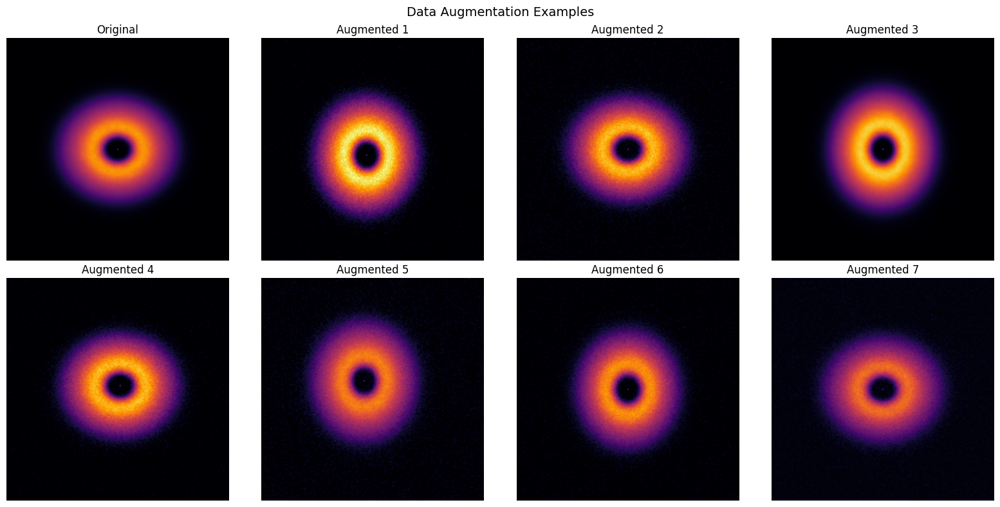

In [28]:
original_img = temp_dataset[0]

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes[0, 0].imshow(original_img.squeeze(0).numpy(), cmap='inferno', vmin=0, vmax=1)
axes[0, 0].set_title('Original')
axes[0, 0].axis('off')

for i in range(7):
    augmented_img = data_transforms(original_img.clone())
    row = (i + 1) // 4
    col = (i + 1) % 4
    axes[row, col].imshow(augmented_img.squeeze(0).numpy(), cmap='inferno', vmin=0, vmax=1)
    axes[row, col].set_title(f'Augmented {i+1}')
    axes[row, col].axis('off')

plt.suptitle('Data Augmentation Examples', fontsize=14)
plt.tight_layout()
plt.show()

In [29]:
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")

Train batches: 5
Val batches: 2


In [30]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    torch.cuda.empty_cache()

model = UNet(latent_dim=64, dropout_rate=0.1).to(device)
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

In [31]:
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)

num_epochs = 150
patience = 15
best_val_loss = float('inf')
epochs_without_improvement = 0
best_model_path = os.path.join(export_dir, 'unet_autoencoder_best_model.pth')

In [32]:
required_vars = ['model', 'train_loader', 'val_loader', 'criterion', 'optimizer', 
                 'device', 'num_epochs', 'patience', 'best_model_path', 'global_stats']

for var_name in required_vars:
    if var_name not in locals() and var_name not in globals():
        raise NameError(f"{var_name} is not defined")

train_losses = []
val_losses = []

for epoch in range(num_epochs):
    train_loss = train_epoch(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    
    val_loss = validate(model, val_loader, criterion, device)
    val_losses.append(val_loss)
    
    print(f"Epoch {epoch+1}/{num_epochs}: Train={train_loss:.6f}, Val={val_loss:.6f}")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_without_improvement = 0
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
            'best_val_loss': best_val_loss,
            'global_stats': global_stats,
            'train_data_folder': train_data_folder
        }, best_model_path)
    else:
        epochs_without_improvement += 1
    
    if (epoch + 1) % 10 == 0:
        checkpoint_path = os.path.join(export_dir, f'checkpoint_epoch_{epoch+1}.pth')
        torch.save({
            'model_state_dict': model.state_dict(),
            'global_stats': global_stats,
            'train_data_folder': train_data_folder,
            'epoch': epoch
        }, checkpoint_path)
    
    if epochs_without_improvement >= patience:
        break

Validation: 100%|██████████| 2/2 [00:00<00:00, 11.66it/s]


Epoch 1/150: Train=0.181428, Val=0.200911


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.23it/s]


Epoch 2/150: Train=0.114488, Val=0.175945


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.58it/s]


Epoch 3/150: Train=0.076764, Val=0.163286


Validation: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


Epoch 4/150: Train=0.050436, Val=0.117398


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s]


Epoch 5/150: Train=0.033931, Val=0.056626


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.90it/s]


Epoch 6/150: Train=0.022666, Val=0.032671


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.64it/s]


Epoch 7/150: Train=0.014465, Val=0.018950


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s]


Epoch 8/150: Train=0.010837, Val=0.014656


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.33it/s]


Epoch 9/150: Train=0.008845, Val=0.011648


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.82it/s]


Epoch 10/150: Train=0.006245, Val=0.008278


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s]


Epoch 11/150: Train=0.005398, Val=0.007935


Validation: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


Epoch 12/150: Train=0.006581, Val=0.009404


Validation: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s]


Epoch 13/150: Train=0.005170, Val=0.005132


Validation: 100%|██████████| 2/2 [00:00<00:00,  6.33it/s]


Epoch 14/150: Train=0.003679, Val=0.003315


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s]


Epoch 15/150: Train=0.004006, Val=0.002532


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.03it/s]


Epoch 16/150: Train=0.004253, Val=0.002459


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.09it/s]


Epoch 17/150: Train=0.003155, Val=0.003907


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s]


Epoch 18/150: Train=0.003522, Val=0.005280


Validation: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s]


Epoch 19/150: Train=0.003957, Val=0.003459


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.02it/s]


Epoch 20/150: Train=0.003672, Val=0.007310


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.69it/s]


Epoch 21/150: Train=0.005497, Val=0.005174


Validation: 100%|██████████| 2/2 [00:00<00:00, 10.51it/s]


Epoch 22/150: Train=0.003651, Val=0.003326


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.83it/s]


Epoch 23/150: Train=0.004444, Val=0.002781


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.96it/s]


Epoch 24/150: Train=0.002651, Val=0.001692


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s]


Epoch 25/150: Train=0.002322, Val=0.001388


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.00it/s]


Epoch 26/150: Train=0.002431, Val=0.001158


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.68it/s]


Epoch 27/150: Train=0.001632, Val=0.001797


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s]


Epoch 28/150: Train=0.003532, Val=0.001091


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.56it/s]


Epoch 29/150: Train=0.001987, Val=0.001017


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.05it/s]


Epoch 30/150: Train=0.002117, Val=0.001186


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.47it/s]


Epoch 31/150: Train=0.001873, Val=0.001000


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.97it/s]


Epoch 32/150: Train=0.001845, Val=0.001277


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.39it/s]


Epoch 33/150: Train=0.001643, Val=0.001234


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.31it/s]


Epoch 34/150: Train=0.002010, Val=0.000840


Validation: 100%|██████████| 2/2 [00:00<00:00, 10.87it/s]


Epoch 35/150: Train=0.001988, Val=0.000853


Validation: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


Epoch 36/150: Train=0.001733, Val=0.001072


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.46it/s]


Epoch 37/150: Train=0.002923, Val=0.002035


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.89it/s]


Epoch 38/150: Train=0.001727, Val=0.001608


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.06it/s]


Epoch 39/150: Train=0.001695, Val=0.000764


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.87it/s]


Epoch 40/150: Train=0.002552, Val=0.000896


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s]


Epoch 41/150: Train=0.004598, Val=0.004674


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.08it/s]


Epoch 42/150: Train=0.001654, Val=0.002262


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s]


Epoch 43/150: Train=0.004076, Val=0.003293


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s]


Epoch 44/150: Train=0.003328, Val=0.002247


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.80it/s]


Epoch 45/150: Train=0.003236, Val=0.002048


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.93it/s]


Epoch 46/150: Train=0.002784, Val=0.002358


Validation: 100%|██████████| 2/2 [00:00<00:00, 10.57it/s]


Epoch 47/150: Train=0.003074, Val=0.001513


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.11it/s]


Epoch 48/150: Train=0.002148, Val=0.000808


Validation: 100%|██████████| 2/2 [00:00<00:00, 12.03it/s]


Epoch 49/150: Train=0.002381, Val=0.001667


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.74it/s]


Epoch 50/150: Train=0.002503, Val=0.001336


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.35it/s]


Epoch 51/150: Train=0.001811, Val=0.001037


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.37it/s]


Epoch 52/150: Train=0.001243, Val=0.000804


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.84it/s]


Epoch 53/150: Train=0.001443, Val=0.001549


Validation: 100%|██████████| 2/2 [00:00<00:00, 11.73it/s]

Epoch 54/150: Train=0.002043, Val=0.001016


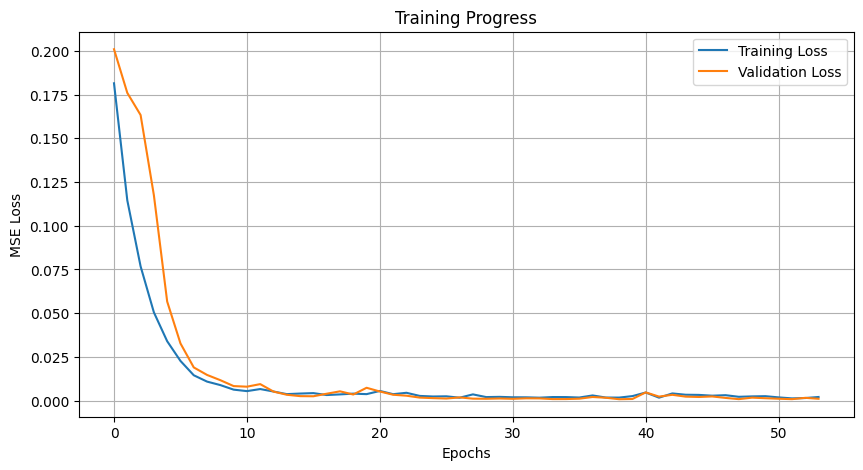

In [33]:
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Training Progress')
plt.legend()
plt.grid(True)
plt.show()

Loaded best model from epoch 39
Model saved to: /kaggle/working/model_exports/unet_autoencoder_final.pth
All outputs in working directory: /kaggle/working

Visualizing reconstructions on VALIDATION set


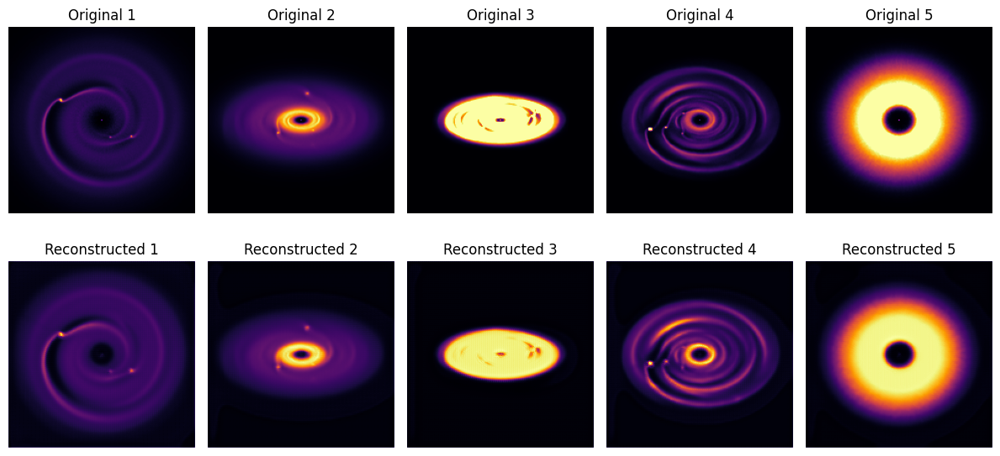

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 11.04it/s]


Validation Metrics:
MSE: 0.000688
SSIM: 0.459182
MS-SSIM: 0.984494


In [34]:
best_checkpoint = torch.load(best_model_path, weights_only=False)
model.load_state_dict(best_checkpoint['model_state_dict'])
print(f"Loaded best model from epoch {best_checkpoint['epoch'] + 1}")

final_model_path = os.path.join(export_dir, 'unet_autoencoder_final.pth')
torch.save({
    'model_state_dict': model.state_dict(),
    'global_stats': global_stats,
    'best_val_loss': best_val_loss,
    'train_data_folder': train_data_folder,
    'training_environment': 'kaggle'
}, final_model_path)

print(f"Model saved to: {final_model_path}")
print(f"All outputs in working directory: {WORK_DIR}")

print("\n" + "=" * 70)
print("Visualizing reconstructions on VALIDATION set")
print("=" * 70)

visualize_reconstructions(model, val_loader, device=device)
metrics = evaluate_model(model, val_loader, device, data_range=1.0)

print(f"\nValidation Metrics:")
print(f"MSE: {metrics['MSE']:.6f}")
print(f"SSIM: {metrics['SSIM']:.6f}")
print(f"MS-SSIM: {metrics['MS-SSIM']:.6f}")

Extracting latent vectors from VALIDATION set


Extracting latent vectors: 100%|██████████| 2/2 [00:00<00:00, 11.70it/s]


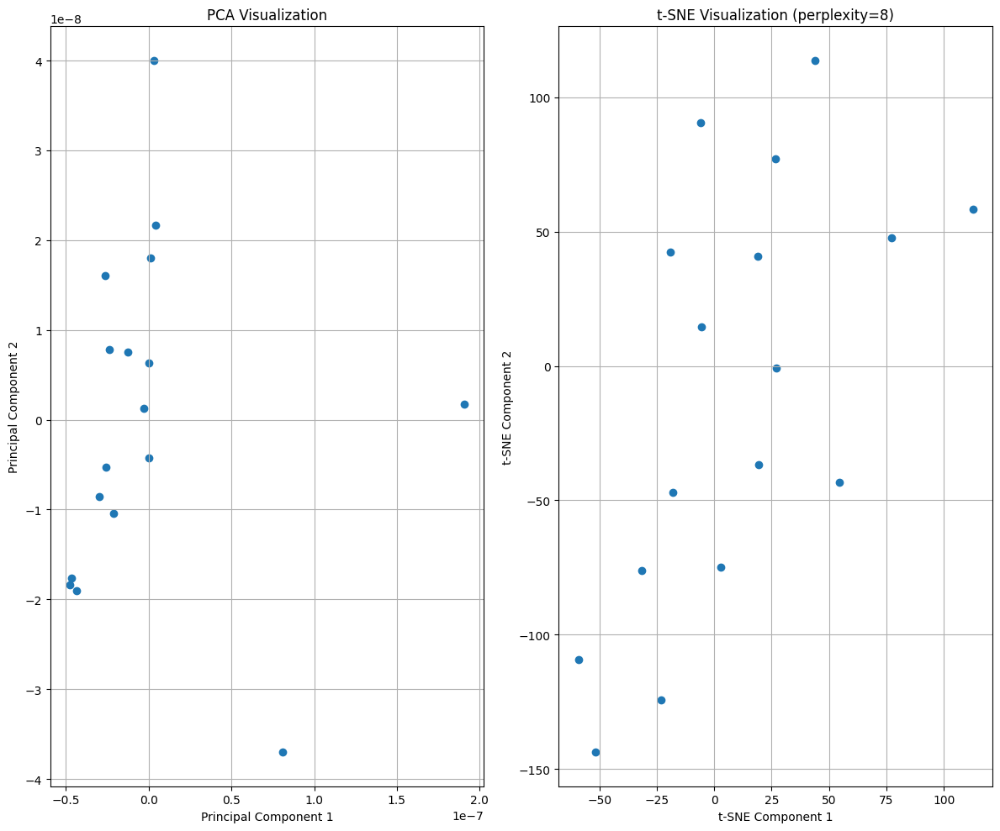

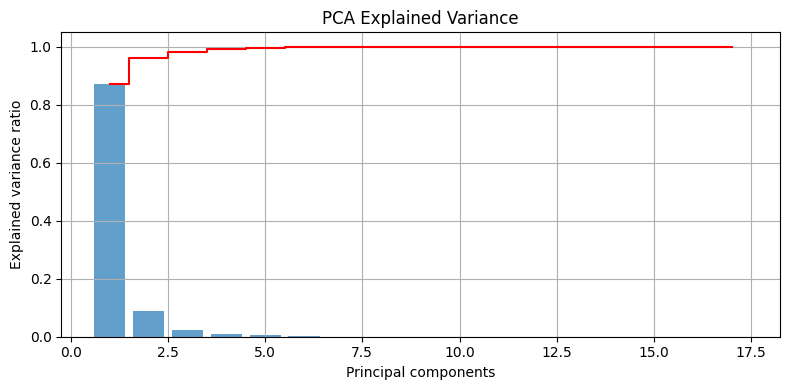

Latent vectors exported to /kaggle/working/model_exports/val_latent_vectors
Latent range: [-0.000150, 0.000135], mean: 0.000013
Vector 3: [-0.000150, 0.000135]
Image 3: [0.011440, 0.132706], mean: 0.033243
Vector 13: [-0.000150, 0.000135]
Image 13: [0.011440, 0.132706], mean: 0.033243
Vector 7: [-0.000150, 0.000135]
Image 7: [0.011440, 0.132706], mean: 0.033243
Vector 16: [-0.000150, 0.000135]
Image 16: [0.011440, 0.132706], mean: 0.033243
Vector 5: [-0.000150, 0.000135]
Image 5: [0.011440, 0.132706], mean: 0.033243


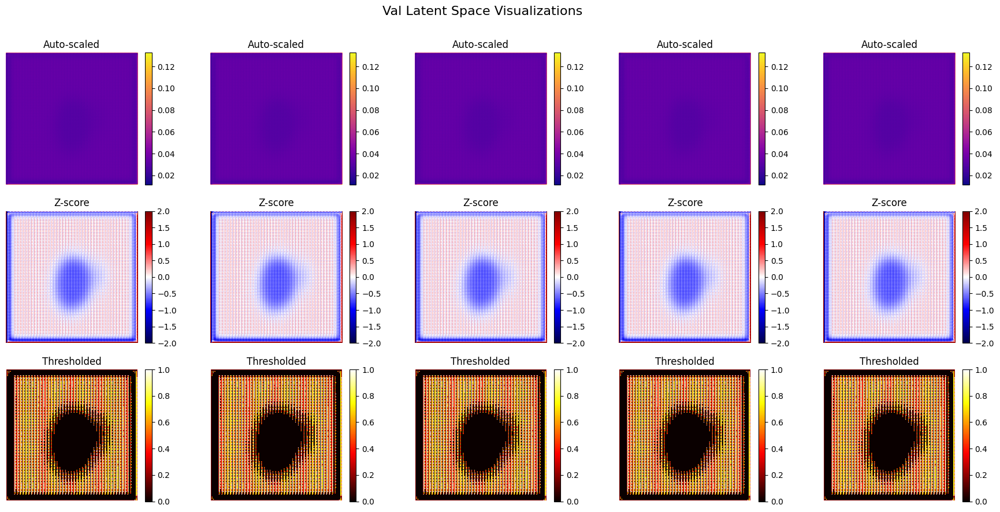


Training and validation analysis complete!


In [35]:
print("=" * 70)
print("Extracting latent vectors from VALIDATION set")
print("=" * 70)

latent_vectors, image_names = extract_latent_representations(model, val_loader, device)
visualize_latent_space(latent_vectors, image_names)

export_filepath = os.path.join(export_dir, "val_latent_vectors")
export_df = export_latent_vectors(latent_vectors, image_names, export_filepath)

visualize_latent_features(model, latent_vectors, image_names, device, export_dir=export_dir, prefix="val")

print("\n" + "=" * 70)
print("Training and validation analysis complete!")
print("=" * 70)

Dataset: 18 images


Inferring: 100%|██████████| 5/5 [00:00<00:00, 17.18it/s]


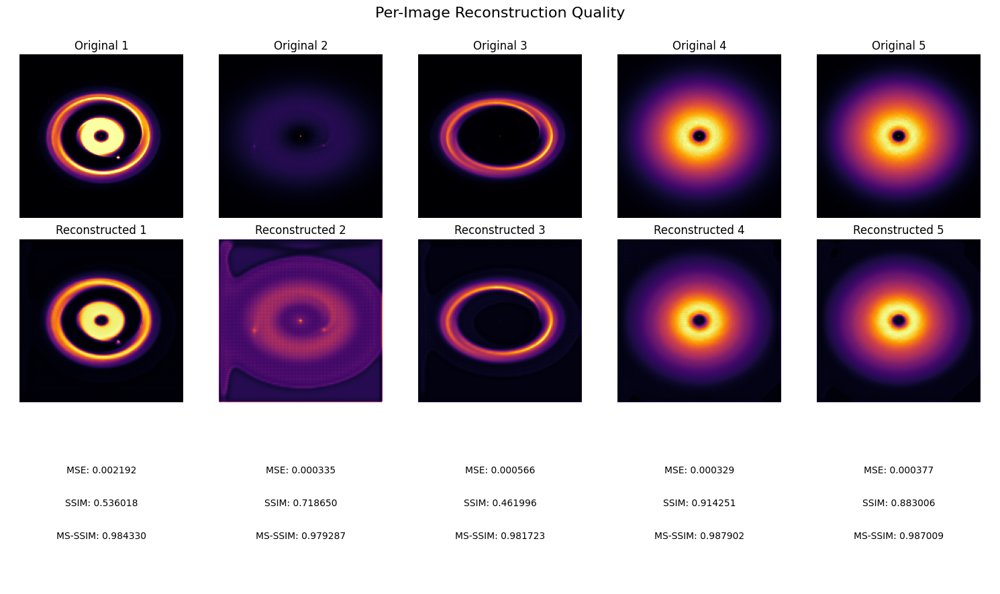

Extracting latent vectors: 100%|██████████| 5/5 [00:00<00:00, 10.91it/s]


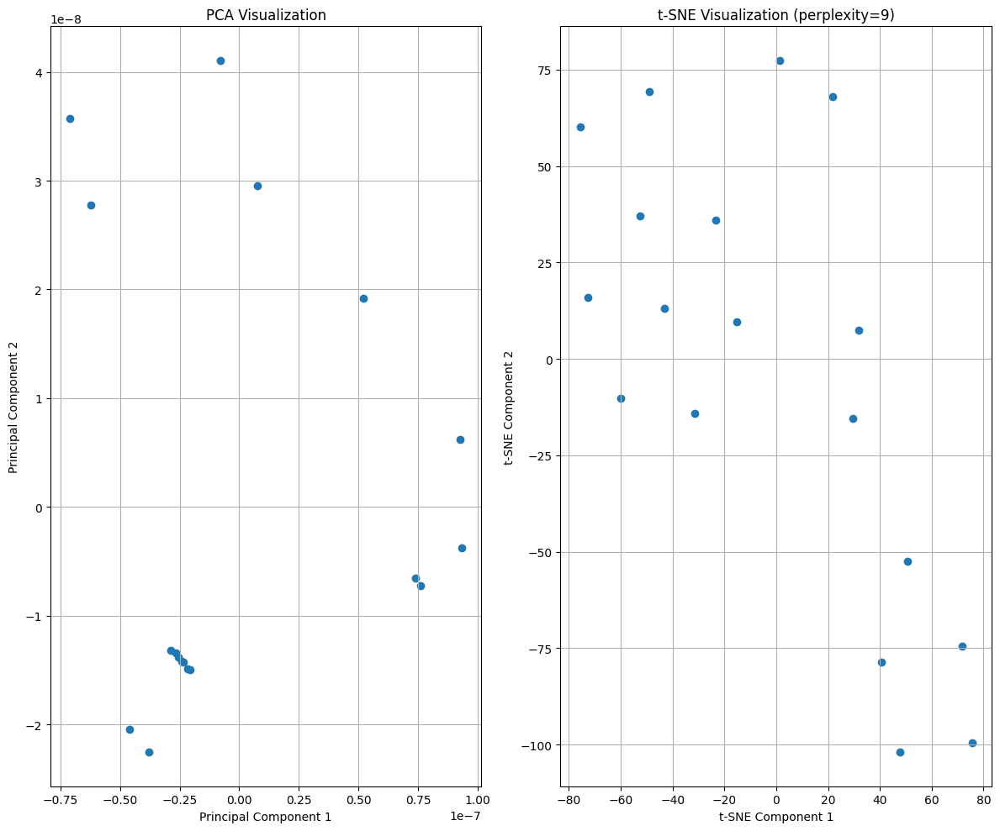

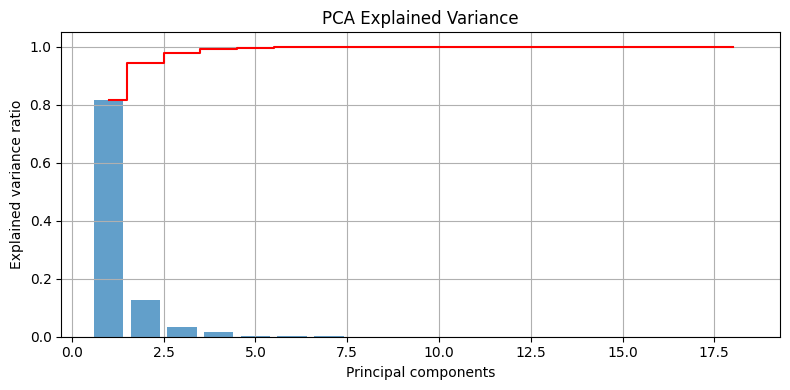

Latent vectors exported to /kaggle/working/test_results/test_latent_vectors


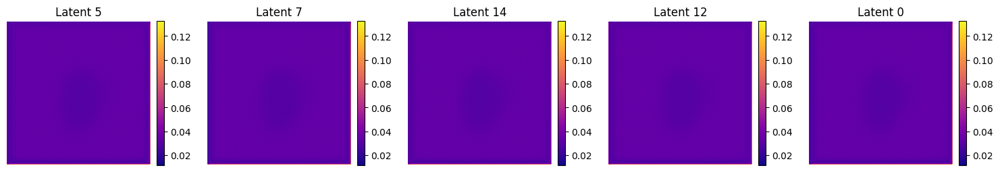

Latent vector for image 5:
[ 3.48483372e-05 -8.06333192e-05 -2.90179087e-05 -5.59081354e-06
  3.16221267e-05  1.17107404e-04 -7.55021028e-06 -3.43944134e-06
  3.63446998e-05  5.35366416e-06 -2.68964213e-05 -2.15065993e-05
  1.63890181e-05  6.40238504e-05  3.38955624e-06  8.89910280e-06
  4.97554684e-05 -1.35799758e-06  1.90769861e-05 -2.31652903e-05
  3.17263220e-06  5.31908627e-05 -5.08971134e-05 -2.65175877e-05
 -1.57788381e-05  5.30596371e-05  3.53310061e-05  1.03250801e-04
  5.11297076e-05  2.25277930e-08 -6.29964279e-06  2.48928245e-06
  2.99279345e-05 -2.29965099e-06  1.48776608e-05 -4.47426282e-05
  5.01803806e-05  4.16583753e-05  7.35537760e-05  8.82430759e-05
  7.17150078e-06 -1.12007683e-05 -4.39273135e-05  4.86514255e-05
  1.82282747e-05 -2.82385572e-05 -1.59193605e-05  5.40016072e-06
 -1.50481166e-04 -3.77003344e-05  6.32312513e-05  1.27029934e-05
  7.34282294e-05  1.99597907e-05  2.53290709e-05  1.54899826e-05
  3.27195230e-05  1.12228692e-04  4.15321892e-06 -9.08426864e-0

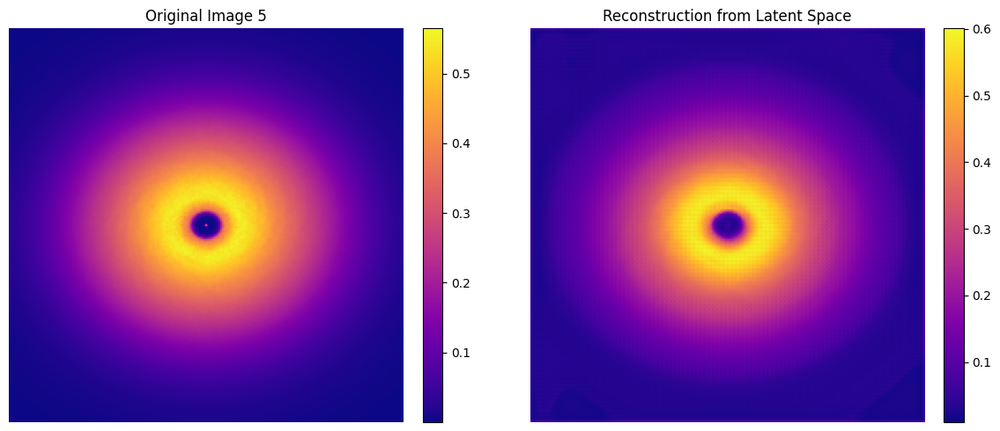

Latent vector for image 7:
[ 3.48419162e-05 -8.06350072e-05 -2.90178596e-05 -5.59040473e-06
  3.16236910e-05  1.17103860e-04 -7.55120300e-06 -3.42547423e-06
  3.63440886e-05  5.35365325e-06 -2.68832355e-05 -2.15057153e-05
  1.63617187e-05  6.40212020e-05  3.38828613e-06  8.89849252e-06
  4.96830580e-05 -1.35874245e-06  1.90776282e-05 -2.31656049e-05
  3.17274225e-06  5.31908590e-05 -5.08979756e-05 -2.65174313e-05
 -1.57794548e-05  5.30590660e-05  3.53311334e-05  1.03198880e-04
  5.11404796e-05  2.30128077e-08 -6.27139161e-06  2.48884248e-06
  2.99055500e-05 -2.29896955e-06  1.48765776e-05 -4.47416278e-05
  5.01603645e-05  4.16770927e-05  7.35547292e-05  8.82413733e-05
  7.16689374e-06 -1.12050866e-05 -4.39244832e-05  4.86538593e-05
  1.82291060e-05 -2.82394922e-05 -1.59176307e-05  5.37779488e-06
 -1.50483611e-04 -3.77000288e-05  6.32317315e-05  1.27035373e-05
  7.34279674e-05  1.99600927e-05  2.53286380e-05  1.54899826e-05
  3.27200833e-05  1.12232185e-04  4.15037266e-06 -9.07224330e-0

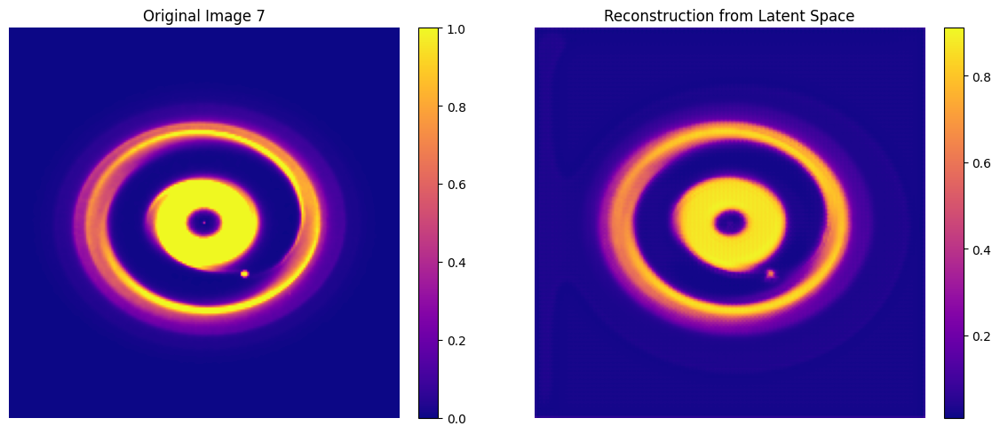

Latent vector for image 14:
[ 3.48445101e-05 -8.06357057e-05 -2.90178614e-05 -5.59096543e-06
  3.16218975e-05  1.17105476e-04 -7.55012570e-06 -3.44254204e-06
  3.63450526e-05  5.35371419e-06 -2.68969870e-05 -2.15063737e-05
  1.63770819e-05  6.40246217e-05  3.38951554e-06  8.89918374e-06
  4.97517831e-05 -1.35816242e-06  1.90764858e-05 -2.31648628e-05
  3.17233662e-06  5.31899423e-05 -5.08975390e-05 -2.65177514e-05
 -1.57797986e-05  5.30595680e-05  3.53308642e-05  1.03260056e-04
  5.11291037e-05  2.28762556e-08 -6.30633849e-06  2.48917058e-06
  2.99345629e-05 -2.29959755e-06  1.48786257e-05 -4.47433013e-05
  5.01741488e-05  4.16610019e-05  7.35515132e-05  8.82429013e-05
  7.17228431e-06 -1.11957106e-05 -4.39266914e-05  4.86497884e-05
  1.82285803e-05 -2.82392757e-05 -1.59185838e-05  5.39992106e-06
 -1.50480744e-04 -3.77009928e-05  6.32306692e-05  1.27017338e-05
  7.34282439e-05  1.99590977e-05  2.53329927e-05  1.54900263e-05
  3.27193520e-05  1.12227448e-04  4.16659213e-06 -9.08999391e-

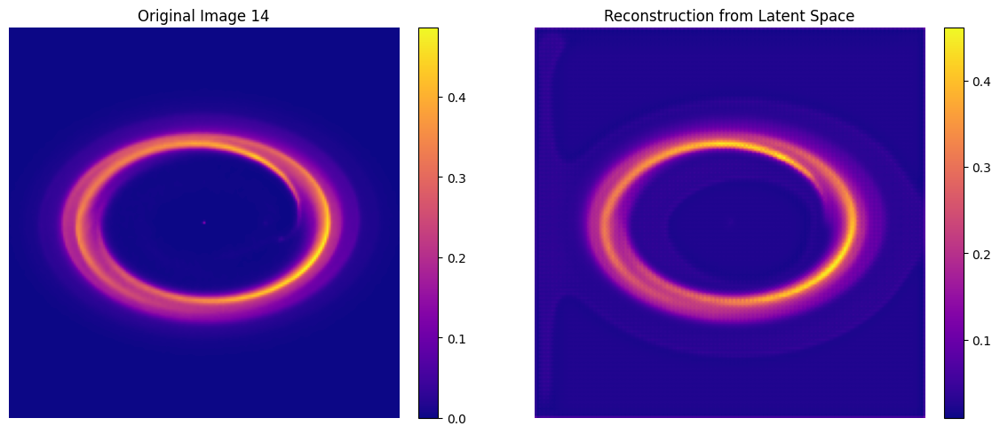

Latent vector for image 12:
[ 3.4849661e-05 -8.0635837e-05 -2.9017829e-05 -5.5902419e-06
  3.1622785e-05  1.1710363e-04 -7.5501393e-06 -3.4358934e-06
  3.6344645e-05  5.3534918e-06 -2.6892734e-05 -2.1505744e-05
  1.6368085e-05  6.4023545e-05  3.3880681e-06  8.8989818e-06
  4.9741189e-05 -1.3585075e-06  1.9077390e-05 -2.3165176e-05
  3.1726042e-06  5.3190586e-05 -5.0897779e-05 -2.6517608e-05
 -1.5779489e-05  5.3059463e-05  3.5331122e-05  1.0323027e-04
  5.1134757e-05  2.2612602e-08 -6.2926906e-06  2.4888311e-06
  2.9922354e-05 -2.2997565e-06  1.4878236e-05 -4.4743552e-05
  5.0181814e-05  4.1672723e-05  7.3552990e-05  8.8241766e-05
  7.1742820e-06 -1.1200680e-05 -4.3924461e-05  4.8651702e-05
  1.8228940e-05 -2.8239127e-05 -1.5918376e-05  5.3957674e-06
 -1.5048149e-04 -3.7700465e-05  6.3230073e-05  1.2702663e-05
  7.3427873e-05  1.9959301e-05  2.5331905e-05  1.5489899e-05
  3.2719530e-05  1.1222980e-04  4.1584435e-06 -9.0958674e-06
  1.3487114e-04  3.5596746e-05 -1.2718173e-04  2.1060832e

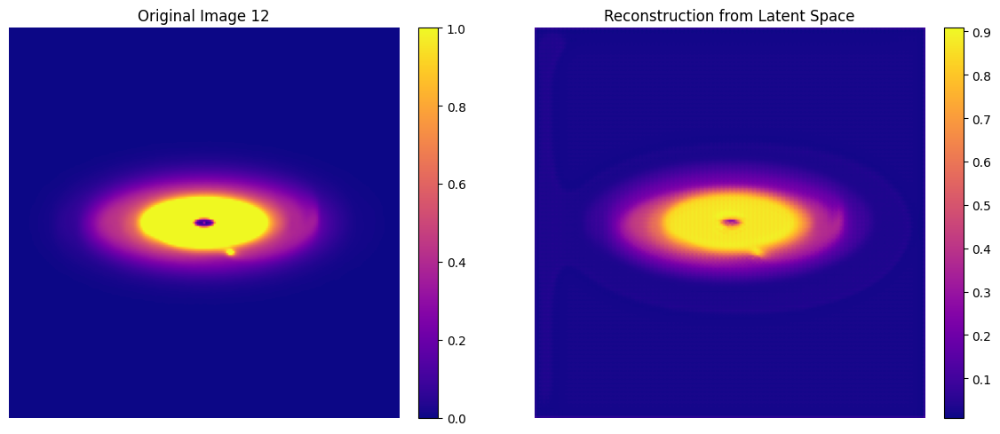

Latent vector for image 0:
[ 3.4844616e-05 -8.0636157e-05 -2.9017880e-05 -5.5906203e-06
  3.1621577e-05  1.1710592e-04 -7.5505222e-06 -3.4459183e-06
  3.6345256e-05  5.3538201e-06 -2.6899674e-05 -2.1506894e-05
  1.6377779e-05  6.4025597e-05  3.3891999e-06  8.8993047e-06
  4.9759401e-05 -1.3579912e-06  1.9076415e-05 -2.3164845e-05
  3.1722027e-06  5.3190259e-05 -5.0897248e-05 -2.6517559e-05
 -1.5779418e-05  5.3059626e-05  3.5331192e-05  1.0326906e-04
  5.1127314e-05  2.2795758e-08 -6.3121565e-06  2.4891838e-06
  2.9938054e-05 -2.2992565e-06  1.4878209e-05 -4.4743945e-05
  5.0172293e-05  4.1658132e-05  7.3551375e-05  8.8243389e-05
  7.1758386e-06 -1.1192036e-05 -4.3927503e-05  4.8649450e-05
  1.8228493e-05 -2.8238997e-05 -1.5918944e-05  5.3981380e-06
 -1.5047993e-04 -3.7700778e-05  6.3230051e-05  1.2701734e-05
  7.3427429e-05  1.9960031e-05  2.5334302e-05  1.5490019e-05
  3.2719068e-05  1.1222777e-04  4.1706558e-06 -9.0908343e-06
  1.3490154e-04  3.5597357e-05 -1.2722610e-04  2.1047147e-

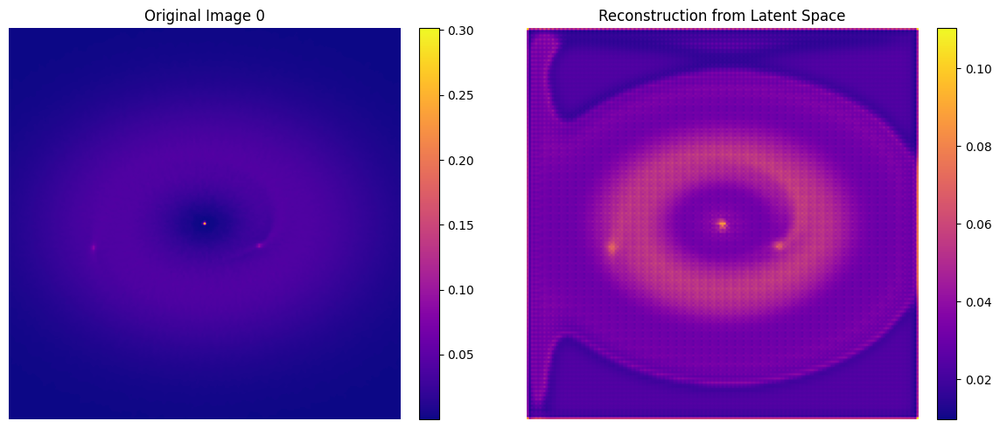

In [36]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_export_dir = os.path.join(WORK_DIR, 'test_results')
os.makedirs(test_export_dir, exist_ok=True)

test_metrics = infer_on_test_data(
    model_path=final_model_path,
    test_data_folder=test_data_folder,
    device=device,
    metrics_output_path=os.path.join(test_export_dir, 'test_metrics.txt'),
    export_dir=test_export_dir,
    specific_indices=-1
)